In [1]:
import os
import pandas as pd
import numpy as np
import pingouin as pg
import seaborn as sns; sns.set_theme()
import matplotlib.pyplot as plt
import warnings


#libraries
import pandas as pd
import numpy as np
import os
import sys
import shutil
import glob
import joblib
import warnings
from datetime import date, datetime

from sklearn.decomposition import PCA
from sklearn.impute import SimpleImputer
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import GroupKFold
from sklearn.model_selection import LeavePGroupsOut
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.utils import resample

import matplotlib.pyplot as plt
import seaborn as sns

from scipy.stats import pearsonr
import scipy.stats as st

from nilearn import image as nli
from nilearn import plotting

from matplotlib.colors import LinearSegmentedColormap

sns.set_style("whitegrid", {'axes.grid' : False})

In [2]:
#@title Import functions
%matplotlib inline  
#!pip install brainspace --quiet
import ipywidgets as widgets  

# Interactive plots
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets # interactive display
my_layout = widgets.Layout()

import numpy as np
from brainspace.datasets import load_conte69
from brainspace.plotting import plot_hemispheres, plot_surf
from brainspace.utils.parcellation import map_to_labels
from brainspace.mesh import mesh_cluster
import panel as pn
pn.extension('vtk')
import os # OS to handle paths
import pandas as pd # pandas for data framse
import csv
import urllib.request as urllib2

import matplotlib.pyplot as plt # For changing the color maps
from matplotlib import cm # cm=colormap
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
# from hcp_regions import HCPRegions
import ipywidgets as widgets       # interactive display

from brainspace.datasets import load_fsa5
from nilearn import datasets
from brainspace.utils.parcellation import reduce_by_labels

##### Load data

In [3]:
path_img_out = '/media/hcs-psy-narun/Alina/HCP_results/predicted_values_for_datasets_5/plots_article/plots_feat_hcpya/'

In [4]:
path='/media/hcs-psy-narun/Alina/HCP_YA/retest/MLtables_cope/'
path_s1200 = '/media/hcs-psy-narun/Alina/HCP_YA/MLtables_cope/'

In [5]:
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

#targets table
targ_retest_test2 = pd.read_csv(path+'cognition_table.csv', index_col=0)['CogTotalComp_Unadj'].dropna()

#demography
demo_retest_test2 = pd.read_csv(path+'demographics_table.csv', index_col=0).reindex(index=targ_retest_test2.index)

#features tables as dictionary
features_retest_test2 = {
    'emo':pd.read_csv(path+'emo_table.csv', index_col=0),
    'gam':pd.read_csv(path+'gam_table.csv', index_col=0),
    'lan':pd.read_csv(path+'lan_table.csv', index_col=0),
    'mot':pd.read_csv(path+'mot_table.csv', index_col=0),
    'rel':pd.read_csv(path+'rel_table.csv', index_col=0),
    'soc':pd.read_csv(path+'soc_table.csv', index_col=0),
    'wm':pd.read_csv(path+'wm_table.csv', index_col=0),
    
    'gam_FC':pd.read_csv(path+'Task_FC_GAMBLING_group_z.csv', index_col=0),
    'lan_FC':pd.read_csv(path+'Task_FC_LANGUAGE_group_z.csv', index_col=0),
    'mot_FC':pd.read_csv(path+'Task_FC_MOTOR_group_z.csv', index_col=0),
    'rel_FC':pd.read_csv(path+'Task_FC_RELATIONAL_group_z.csv', index_col=0),
    'soc_FC':pd.read_csv(path+'Task_FC_SOCIAL_group_z.csv', index_col=0),
    'wm_FC':pd.read_csv(path+'Task_FC_WM_group_z.csv', index_col=0),
    
    'cort':pd.read_csv(path+'cort_table.csv', index_col=0),
    'subc':pd.read_csv(path+'subc_table.csv', index_col=0),
    'surf':pd.read_csv(path+'surf_table.csv', index_col=0),
    'rest':pd.read_csv(path+'Rest_FC_retest_group_z_full.csv', index_col=0),
    'VolBrain':pd.read_csv(path+'VolBrain_table.csv', index_col=0)
}

for key in features_retest_test2.keys():
    features_retest_test2[key] = features_retest_test2[key].reindex(index=targ_retest_test2.index)

#table with movements (mean relative displacement Movement_RelativeRMS_mean.txt)
movements_retest_test2 = pd.read_csv(path+'movement_table.csv', index_col=0).reindex(index=targ_retest_test2.index)

#create tables with 2 controling parameters: gender and age
sex_coded_retest_test2 = pd.Series(LabelEncoder().fit_transform(demo_retest_test2.loc[:,['Gender']]), index=demo_retest_test2.index, name='Gender')
control_retest_test2 = pd.concat([sex_coded_retest_test2, demo_retest_test2.loc[:, ['Age_in_Yrs']]], axis=1).reindex(index=targ_retest_test2.index)


In [6]:
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

#targets table
targ_main = pd.read_csv(path_s1200+'cognition_table.csv', index_col=0)['CogTotalComp_Unadj'].dropna()

#demography
demo_main = pd.read_csv(path_s1200+'demographics_table.csv', index_col=0).reindex(index=targ_main.index)

#features tables as dictionary
features_main = {
    'emo':pd.read_csv(path_s1200+'emo_table.csv', index_col=0),
    'gam':pd.read_csv(path_s1200+'gam_table.csv', index_col=0),
    'lan':pd.read_csv(path_s1200+'lan_table.csv', index_col=0),
    'mot':pd.read_csv(path_s1200+'mot_table.csv', index_col=0),
    'rel':pd.read_csv(path_s1200+'rel_table.csv', index_col=0),
    'soc':pd.read_csv(path_s1200+'soc_table.csv', index_col=0),
    'wm':pd.read_csv(path_s1200+'wm_table.csv', index_col=0),
    
    'gam_FC':pd.read_csv(path_s1200+'Task_FC_GAMBLING_group_z_full.csv', index_col=0),
    'lan_FC':pd.read_csv(path_s1200+'Task_FC_LANGUAGE_group_z_full.csv', index_col=0),
    'mot_FC':pd.read_csv(path_s1200+'Task_FC_MOTOR_group_z_full.csv', index_col=0),
    'rel_FC':pd.read_csv(path_s1200+'Task_FC_RELATIONAL_group_z_full.csv', index_col=0),
    'soc_FC':pd.read_csv(path_s1200+'Task_FC_SOCIAL_group_z_full.csv', index_col=0),
    'wm_FC':pd.read_csv(path_s1200+'Task_FC_WM_group_z_full.csv', index_col=0),
    
    'cort':pd.read_csv(path_s1200+'cort_table.csv', index_col=0),
    'subc':pd.read_csv(path_s1200+'subc_table.csv', index_col=0),
    'surf':pd.read_csv(path_s1200+'surf_table.csv', index_col=0),
    'rest':pd.read_csv(path_s1200+'Rest_FC_group_z_full.csv', index_col=0),
    'VolBrain':pd.read_csv(path_s1200+'VolBrain_table.csv', index_col=0)
}

for key in features_main.keys():
    features_main[key] = features_main[key].reindex(index=targ_main.index)

#table with movements (mean relative displacement Movement_RelativeRMS_mean.txt)
movements_main = pd.read_csv(path_s1200+'movement_table.csv', index_col=0)

#create tables with 2 controling parameters: gender and age
sex_coded_main = pd.Series(LabelEncoder().fit_transform(demo_main.loc[:,['Gender']]), index=demo_main.index, name='Gender')
control_main = pd.concat([sex_coded_main, demo_main.loc[:, ['Age_in_Yrs']]], axis=1).reindex(index=targ_main.index)

In [7]:
#spliting main ito train and retest_test1

demo_retest_test1 = demo_main.loc[demo_retest_test2.index,:]
targ_retest_test1 = targ_main.loc[demo_retest_test2.index]
movements_retest_test1 = movements_main.loc[demo_retest_test2.index,:]
control_retest_test1 = control_main.loc[demo_retest_test2.index,:]
features_retest_test1 = {}
for key in features_main.keys():
    features_retest_test1[key] = features_main[key].loc[demo_retest_test2.index,:]


demo_train = demo_main.drop(demo_retest_test2.index, axis=0)
targ_train = targ_main.drop(demo_retest_test2.index, axis=0)
movements_train = movements_main.drop(demo_retest_test2.index, axis=0)
control_train = control_main.drop(demo_retest_test2.index, axis=0)
features_train = {}
for key in features_main.keys():
    features_train[key] = features_main[key].drop(demo_retest_test2.index, axis=0)

##### Calculate ICC for each brain's ROI or feature

In [11]:
#uncomment this section if run for the first time
#it may take a couple of hours

"""print('start', datetime.now())

dct_icc_brain = {}

for mod in list(features_retest_test2.keys()):

    #load tables with stacked y_pred
    dff1 = features_retest_test1[mod]#pd.read_csv(path+mod+'_retest1.csv', index_col=0)
    dff2 = features_retest_test2[mod]#pd.read_csv(path+mod+'_retest2.csv', index_col=0)

    i = 0
    dct_icc={}
    while i < len(dff1.columns):
        #create tables for pingouin format
        df1=dff1.iloc[:,i]
        df2=dff2.iloc[:,i]
        df_comp = pd.DataFrame({'subj': np.append(df1.index, df2.index),
                                'trial': np.append(np.full(len(df1.index), 1), np.full(len(df2.index), 2)),
                                'scores': np.array(pd.concat([df1, df2], axis=0))})

        icc_table = pg.intraclass_corr(data = df_comp, targets='subj', raters='trial', ratings='scores')

        dct_icc[dff1.iloc[:,i].name] = pd.Series({'ICC2' : icc_table.iloc[1,2], 
                                                  'ICC3' : icc_table.iloc[2,2],
                                                  'CI2' : icc_table.iloc[1,7], 
                                                  'CI3' : icc_table.iloc[2,7]} )

        i+=1

    df_icc = pd.DataFrame(dct_icc).T

    dct_icc_brain[mod] = df_icc['ICC3']
    
print('finish', datetime.now())

#save output
joblib.dump(dct_icc_brain,  (path_img_out+'dct_icc_brain_nonadj.sav'))"""

In [4]:
#uncomment and use this section if needs to load already calculated results

dct_icc_brain = joblib.load(path_img_out+'dct_icc_brain_nonadj.sav', mmap_mode='r')

##### Mean ICC for each modality

In [5]:
av_icc = {}
for key in dct_icc_brain.keys():
    av_icc[key] = dct_icc_brain[key].mean()
df_av_icc = pd.Series(av_icc)
#df_av_icc.drop('target_y')

display(df_av_icc.sort_values(ascending=False))

VolBrain    0.994461
subc        0.894574
surf        0.878840
cort        0.852953
rest        0.640958
lan         0.547937
lan_FC      0.403200
mot         0.385699
rel_FC      0.349476
soc_FC      0.348874
wm_FC       0.323242
mot_FC      0.318730
emo         0.298811
wm          0.294170
gam_FC      0.259790
soc         0.256745
rel         0.177783
gam         0.133029
dtype: float64

##### Plot

##### Task contrasts

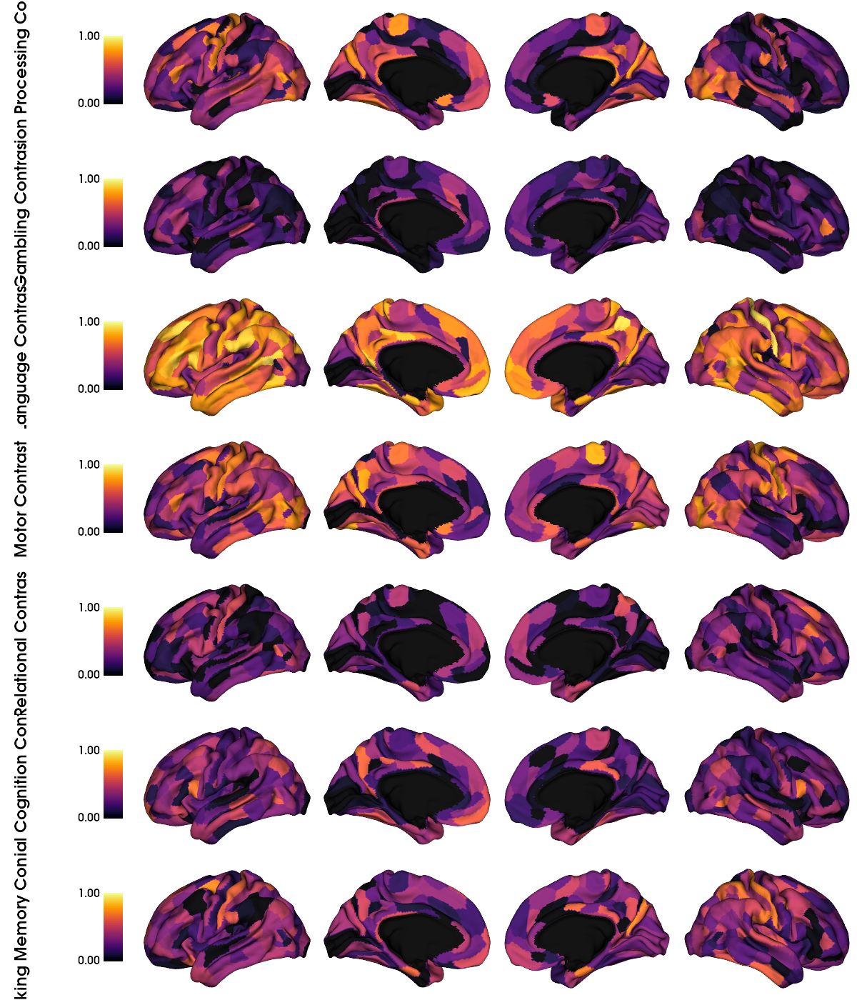

In [7]:
# First load the Glasser annotation file
file_url='https://raw.githubusercontent.com/rcruces/2020_NMA_surface-plot/master/data/glasser_360_conte69.csv'
Glasser = np.loadtxt(urllib2.urlopen(file_url), dtype=int)

# and load the conte69 surfaces
surf_lh, surf_rh = load_conte69()


# Mask the 0-value ROI of the medial wall
mask = Glasser != 0

task_keys = ['emo', 'gam', 'lan', 'mot', 'rel', 'soc', 'wm']
task_keys_lab = ['Emotion Processing Contrast',
                 'Gambling Contrast',
                 'Language Contrast',
                 'Motor Contrast', 
                 'Relational Contrast',
                 'Social Cognition Contrast', 
                 'Working Memory Contrast',]
task = [None] * len(task_keys)

for i, tkey in enumerate(task_keys):
    
    icc_brain = dct_icc_brain[tkey]#.mask(dct_icc_brain[tkey] < 0.4).fillna(0)
    
    # add a 0 entry that will match the medial wall index of the final array
    rho = np.concatenate((0, icc_brain[:360].values.astype(float)), axis=None)
    # Map the vector values to the vertices indices
    rho_ver = map_to_labels(rho, Glasser, mask=mask,fill=np.nan)
    
    task[i] = rho_ver

cmap='inferno'#'YlOrRd'#sns.color_palette("light:r", as_cmap=True)#LinearSegmentedColormap.from_list('postv', ['white', 'red'])

# Plot  values over the surface
plot_hemispheres(surf_lh, surf_rh,      # Surfaces
                 array_name=task,    # Vector of alues to plot
                 size=(1200, 200*len(task_keys)),       # Size of the output figure
                 #label_text={'left':['random rho']}, # Text and position
                 color_bar='left',#color_bar='top',       # Position of the colorbar
                 cmap=cmap,#'YlOrRd',       # COlormap from matplotlib
                 zoom=1.5,             # zoom on the surface
                 embed_nb=True,         # Embeded this ins inline plot
                 interactive=False,     # Pop-up plot, for embed_nb=True default is False
                 #share='both',          # match to colormap on rows and columns
                 color_range=(0,1),#'sym',#(-0.13, 0.13),       # color range
                 nan_color=(0, 0, 0, 1), # nan-color (medial wall) default black
                 background = (1, 1, 1),# Background color, default is white
                 label_text=task_keys_lab
                )



emo


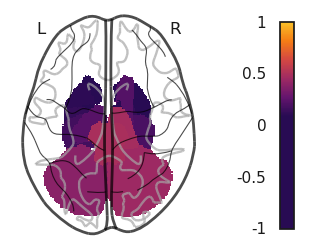

gam


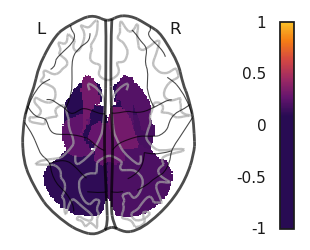

lan


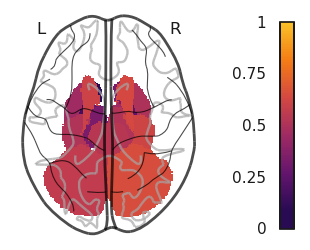

mot


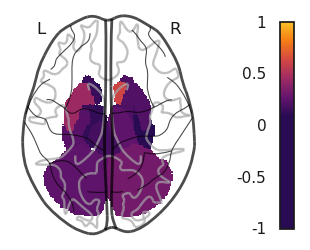

rel


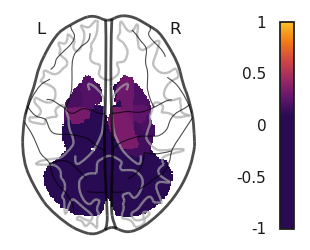

soc


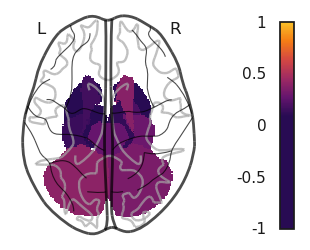

wm


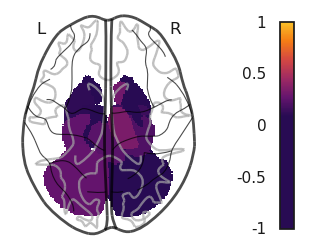

In [8]:
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

#plot task contrasts on one brain projection, subcortex only

#load atlases
wway = '/media/hcs-psy-narun/Alina/atlases/'
atlas2 = nli.load_img(wway+'subc2.fs.nii.gz')

par_dat2 = atlas2.get_fdata()

cmap = LinearSegmentedColormap.from_list('postv', [#'#280b53', '#280b53', '#280b53',
                                            '#280b53', '#280b53', '#280b53','#280b53', '#280b53', '#280b53',
                                            '#280b53', '#65156e', '#9f2a63', '#d44842', '#f57d15', '#fac228'])


for key in ['emo', 'gam','lan', 'mot', 'rel', 'soc', 'wm']: #contrasts only
    #empty image in the same way as reffered atlas
    site_nii2 = np.zeros(par_dat2.shape)
    #dataframe to plot
    data = dct_icc_brain[key]#.mask(dct_icc_brain[key] < 0.4).fillna(0)   
    
    #subcortex, the table has same order as atlas
    vec2 = pd.Series((data[360:]).values, index=pd.read_csv(wway+'atlas_index_num.txt')['nn'].values )

    for index, numb in zip(vec2.index, vec2.iloc[:]): 
        site_nii2[par_dat2 == (index)] = numb
    
    #create image object
    site_img2 = nli.new_img_like(atlas2, site_nii2, atlas2.affine, copy_header=True)
    
    #display
    print(key)
    display2 = plotting.plot_glass_brain(site_img2, plot_abs=False, cmap=cmap,#'RdYlBu_r',       
                                         colorbar=True, display_mode='z',
                                         vmin=0, vmax=1,)
                                         #threshold=0.4)
    
    plt.savefig(path_img_out+'ICC_Brain_NoAdj_tasks_subc_'+key+'_plot_image.svg',bbox_inches='tight')
    
    plotting.show()

##### Structural MRI

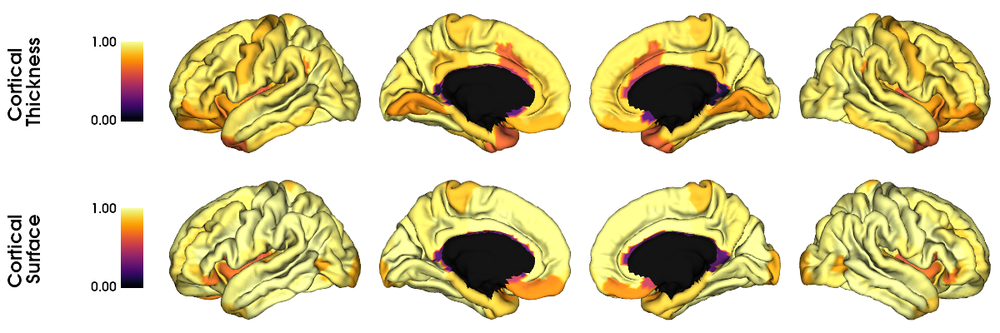

In [10]:
# Fetch surface atlas
destrx = datasets.fetch_atlas_surf_destrieux()

# Load fsaverage5 surfaces
surf_lh, surf_rh = load_fsa5()

# Remove non-cortex regions
regions = destrx['labels'].copy()
masked_regions = [b'Medial_wall', b'Unknown']
masked_labels = [regions.index(r) for r in masked_regions]
for r in masked_regions:
    regions.remove(r)

# Build Destrieux parcellation and mask
labeling = np.concatenate([destrx['map_left'], destrx['map_right']])
mask_destrx = ~np.isin(labeling, masked_labels)


# Map gradients to original parcels
anat_keys = ['cort', 'surf']
anat_keys_lab = ['Cortical \nThickness', 
                 'Cortical \nSurface']
anat = [None] * len(anat_keys)
for i, akey in enumerate(anat_keys):
    rho = map_to_labels(dct_icc_brain[akey].values.astype('float'), 
                        labeling, mask=mask_destrx, fill=np.nan)
    
    anat[i] = rho

plot_hemispheres(surf_lh, surf_rh, 
                 array_name=anat, 
                 size=(1200, 200*len(anat_keys)), 
                 cmap='inferno',
                 color_bar='left', 
                 zoom=1.5,
                 embed_nb=True,         
                 interactive=False,
                 #share='both',
                 color_range=(0, 1),       # color range
                 nan_color=(0, 0, 0, 1), # nan-color (medial wall) default black
                 background = (1, 1, 1),
                 label_text=anat_keys_lab
                )

subc


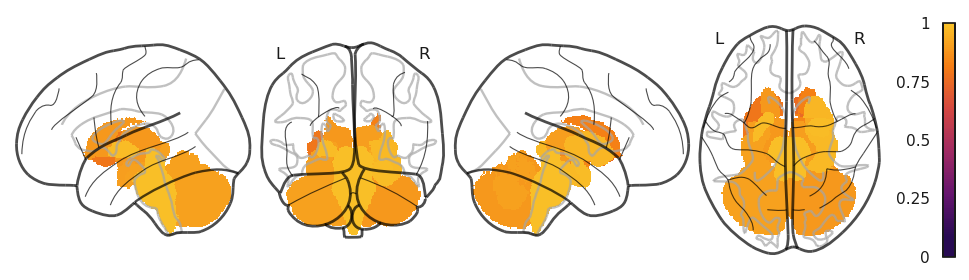

In [11]:
#plot anatomical cortical and subcortical feature importance (from FreeSurfer, Destrieux atlas)
wway = '/media/hcs-psy-narun/Alina/atlases/'
#load atlases
atlas2 = nli.load_img(wway+'subc2.fs.nii.gz')

cmap = LinearSegmentedColormap.from_list('postv', [#'#280b53', '#280b53', '#280b53',
                                            '#280b53', '#280b53', '#280b53','#280b53', '#280b53', '#280b53',
                                            '#280b53', '#65156e', '#9f2a63', '#d44842', '#f57d15', '#fac228'])


    
#subcortex

#empty image in the same way as reffered atlas
par_dat2 = atlas2.get_fdata()
site_nii2 = np.zeros(par_dat2.shape)
#reorder subc table into atlas order
dtvc = dct_icc_brain['subc']#.mask(dct_icc_brain['subc'] < 0.4).fillna(0)
#std
#dtvc = pd.DataFrame(StandardScaler().fit_transform(dtvc.T.values),
#                    index=dtvc.T.index, columns=dtvc.T.columns).T
v2 = dtvc#.mean()
vec2 =pd.Series(v2.values, index=pd.read_csv(wway+'atlas_index_num.txt')['nn'].values )
#fill mat with numbers
for index, numb in zip(vec2.index, vec2.iloc[:]): 
    site_nii2[par_dat2 == (index)] = numb
#create image object
site_img2 = nli.new_img_like(atlas2, site_nii2, atlas2.affine, copy_header=True)
#display
print('subc')
display_subc = plotting.plot_glass_brain(site_img2, plot_abs=False, cmap=cmap,  #different colormap
                                         colorbar=True, display_mode='lyrz', 
                                         vmax=1)#vmin=0.4, 

plt.savefig(path_img_out+'ICC_Brain_NoAdj_struct_subc_plot_image.svg',bbox_inches='tight')

plotting.show()

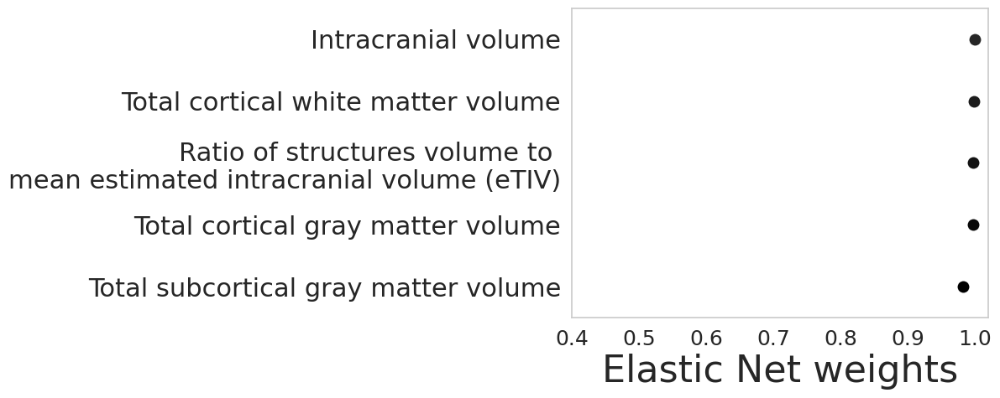

In [20]:
#Total Brain Volume

data = dct_icc_brain['VolBrain'].mask(dct_icc_brain['VolBrain'] < 0.4).fillna(0)#dct_elnet_coeff['VolBrain']
data.index = ['Intracranial volume',
                'Total cortical gray matter volume',
                'Total subcortical gray matter volume',
                'Total cortical white matter volume',
                'Ratio of structures volume to \nmean estimated intracranial volume (eTIV)']

#data = pd.DataFrame(StandardScaler().fit_transform(data.T.values), 
#                    index=data.T.index, columns=data.T.columns).T

data = pd.DataFrame(data.sort_values(ascending=False)).T
#data.T.to_csv(path2+'TBV_plot_numbers.csv')
#sns.boxplot(data=data, orient="h", color='tab:blue')
sns.swarmplot(data=data, color="black", orient="h", size=10)

plt.xticks(fontsize=18)
plt.yticks(fontsize=22)
plt.xlim((0.4,1.02))
#plt.xlabel('', fontsize=21)
plt.xlabel('Elastic Net weights', fontsize=32)
#plt.title('Coefficients of Each Feature in\nthe Total Brain Volume Modality\n',fontsize=36)

plt.savefig(path_img_out+'ICC_Brain_NoAdj_TotalVolume_plot_image.svg',bbox_inches='tight')

plt.show()

##### Resting State and Task FC

In [23]:
#RESTING STATE and TASK FC 

#reorganize from pairs of ROIs back to matrix format
ind_task=dct_icc_brain['wm'].index

dct_FC_mat = {}
for key in ['rest', 'gam_FC', 'lan_FC', 'mot_FC', 'rel_FC', 'soc_FC', 'wm_FC']:
    #dataframe to convert
    data_i  = dct_icc_brain[key]

    #df_std_FC = pd.DataFrame()
    #standardize
    #for indx in data_i.index:
    #    df_std_FC[indx] = pd.DataFrame(StandardScaler().fit_transform(data_i.loc[indx,:].values.reshape(-1, 1)), 
    #                                   index=data_i.loc[indx,:].index)[0]
    df_std_FC = data_i#.T
    
    #average across folds    
    data = df_std_FC#.mean()

    #restore full matrix
    ind379 = np.triu_indices(379, k=1)
    mat379 = np.zeros((379,379),float)
    mat379[ind379]=data.values
    mat379_2 = pd.DataFrame(mat379).replace(0, np.nan)
    mat379_f = pd.DataFrame(np.where(mat379,mat379_2,mat379_2.T))
    mat379_f.index = ind_task
    mat379_f.columns = ind_task
    
    #save mat to dct
    dct_FC_mat[key] = mat379_f

In [25]:
glanets = pd.read_csv('/media/hcs-psy-narun/Alina/atlases/Glasser-Cole_match_table.txt')

In [26]:
tab_subc = pd.DataFrame({'orig_order':np.arange(361,380,1),
                         'left_first_order':np.arange(361,380,1),
                         'Cole_net_order':np.full(19,13),
                         'name_Glasser':ind_task[-19:],
                         'Cole_net_name':np.full(19,'Subcortex')
                         }, index=np.arange(360,379,1))

In [27]:
glanets = pd.concat([glanets,tab_subc], axis=0)

In [30]:
vec = []
vec_nms = []
k=0
for i in sorted(set(glanets['Cole_net_order'])):
    #print(i)
    display()
    k+= int(len(glanets[glanets['Cole_net_order']==i].index))
    vec+=[k]
    nms = glanets[glanets['Cole_net_order']==i]['Cole_net_name'].values[0]
    vec_nms+= [nms]

##### Plot

In [ ]:
for key in ['rest', 'gam_FC', 'lan_FC', 'mot_FC', 'rel_FC', 'soc_FC', 'wm_FC']:
    print(key)
    indx = glanets.sort_values(by=['Cole_net_order'])['name_Glasser'].values
    data = dct_FC_mat[key].reindex(index=indx, columns=indx)

    fig= plt.figure(figsize=(12,10))

    ax =sns.heatmap(data=data, cmap='inferno',vmin=0, vmax=1)
    plt.xticks([])
    plt.yticks([])

    vec = []
    vec_nms = []
    k=0
    for i in sorted(set(glanets['Cole_net_order'])):
        #print(i)
        display()
        k+= int(len(glanets[glanets['Cole_net_order']==i].index))
        vec+=[k]
        nms = glanets[glanets['Cole_net_order']==i]['Cole_net_name'].values[0]
        vec_nms+= [nms]

    for k in vec[:-1]:
        plt.axvline(x=k, color='white')
        plt.axhline(y=k, color='white')

    # use matplotlib.colorbar.Colorbar object
    cbar = ax.collections[0].colorbar
    # here set the labelsize by 20
    cbar.ax.tick_params(labelsize=20)

    plt.savefig(path_img_out+'ICC_Brain_NoAdj_FCs_'+key+'_1_plot_image.svg',bbox_inches='tight')

    plt.show()

rest


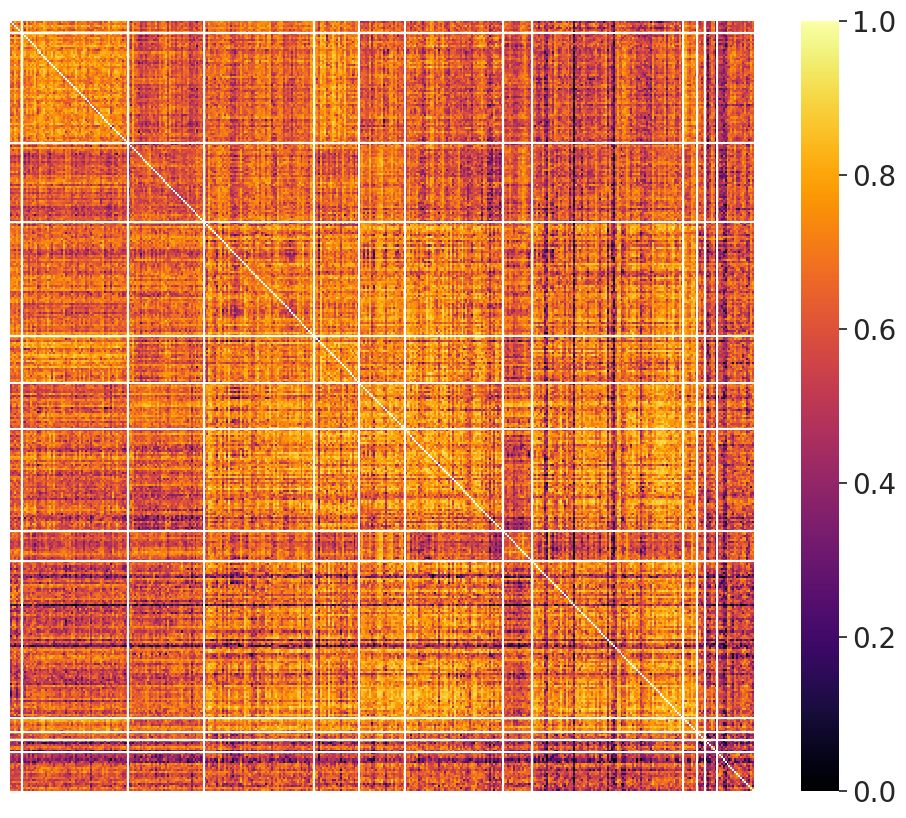

gam_FC


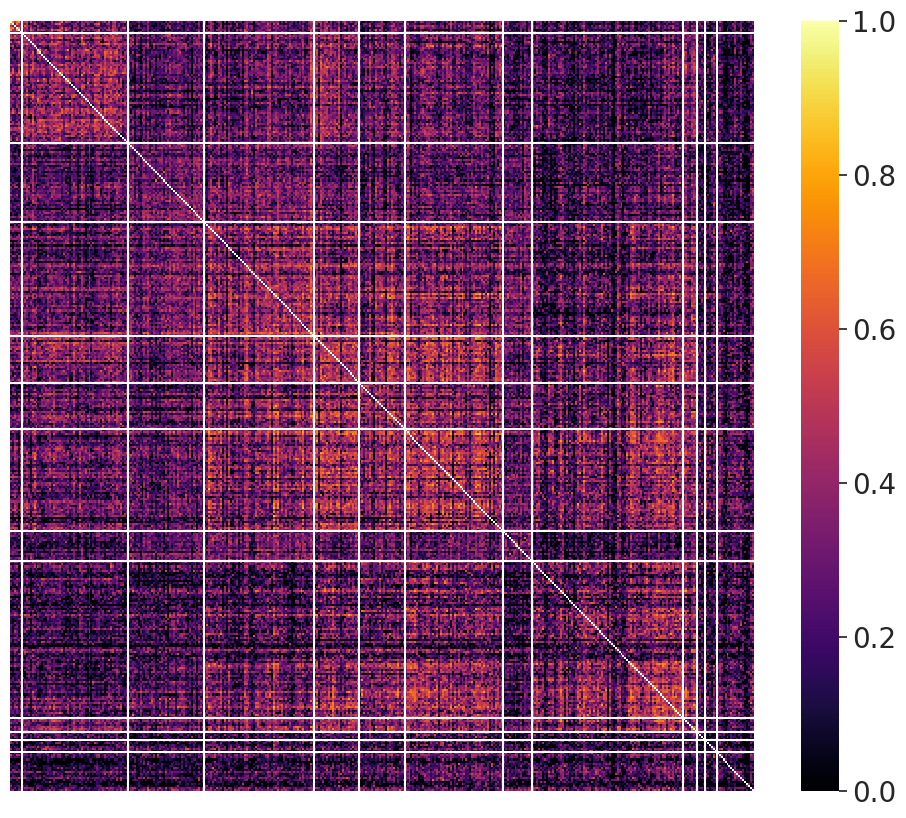

lan_FC


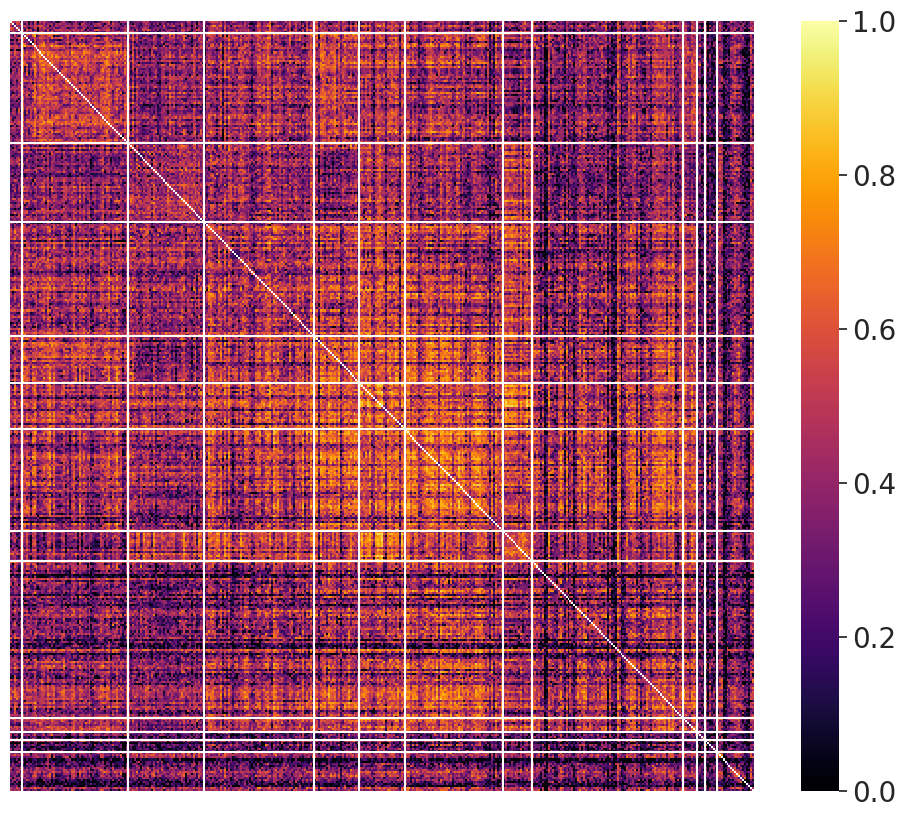

mot_FC


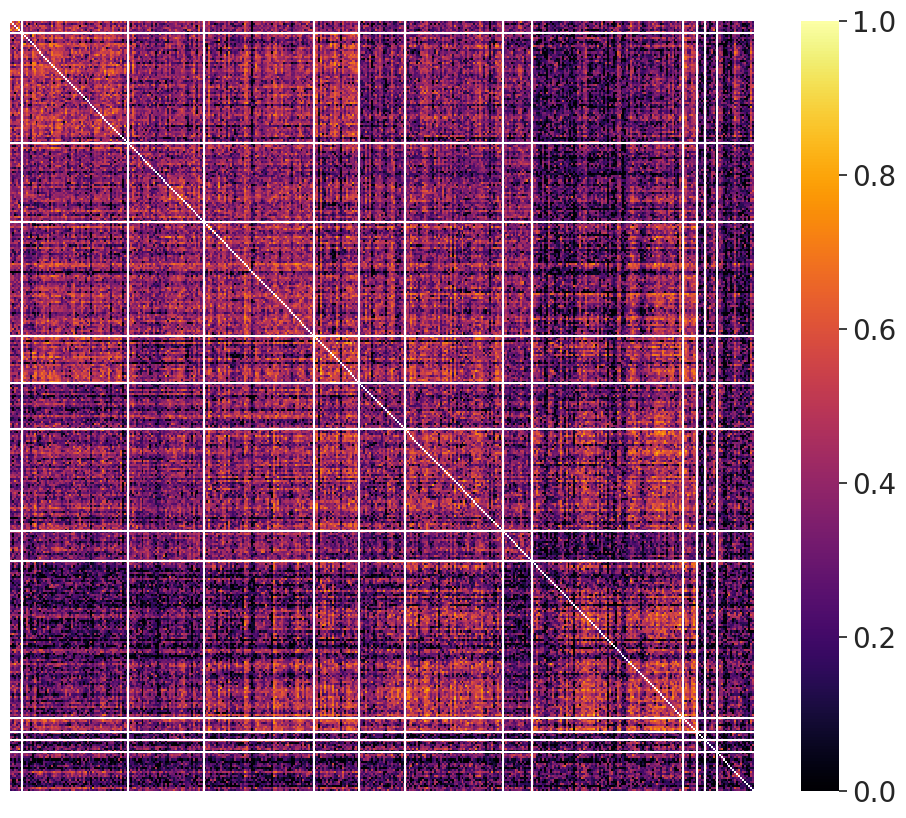

rel_FC


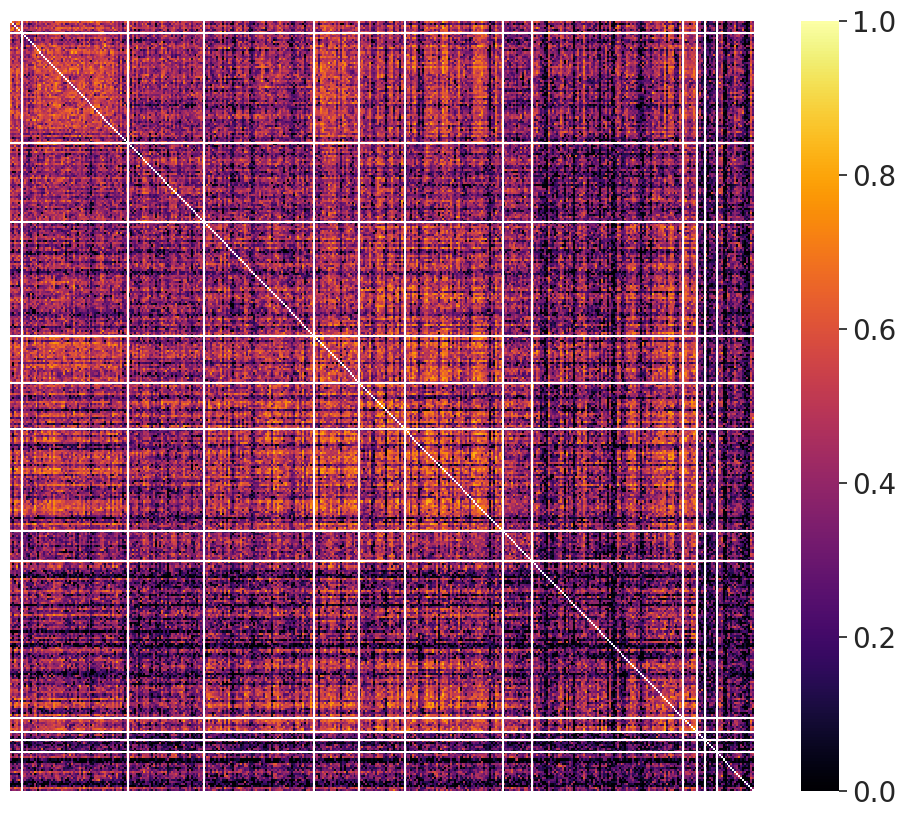

soc_FC


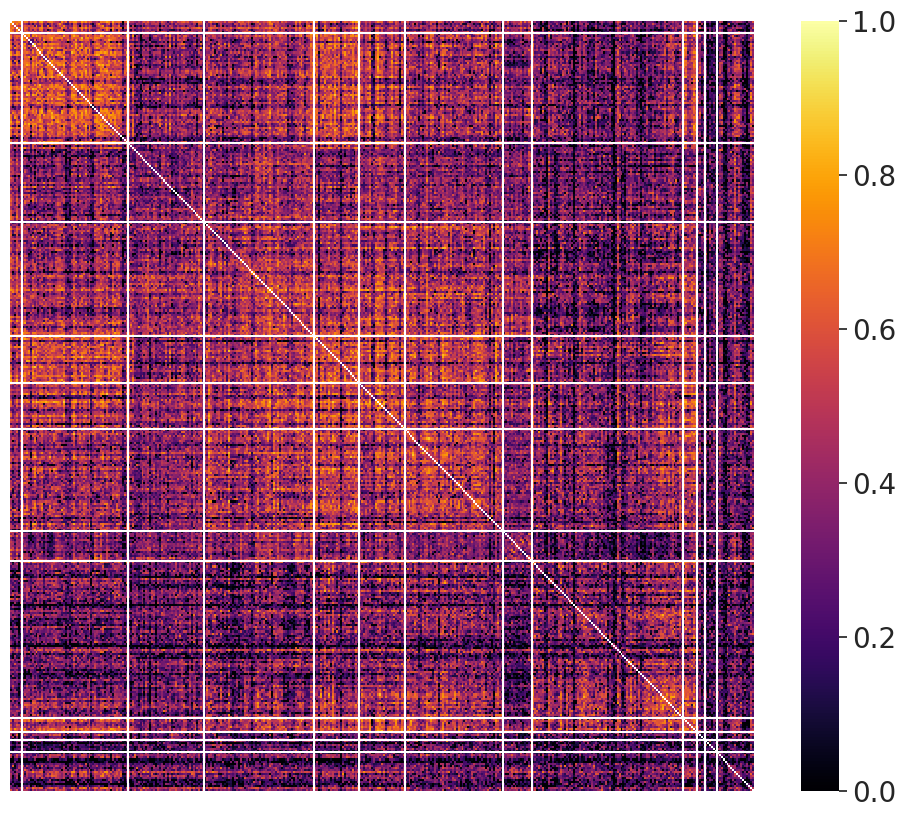

wm_FC


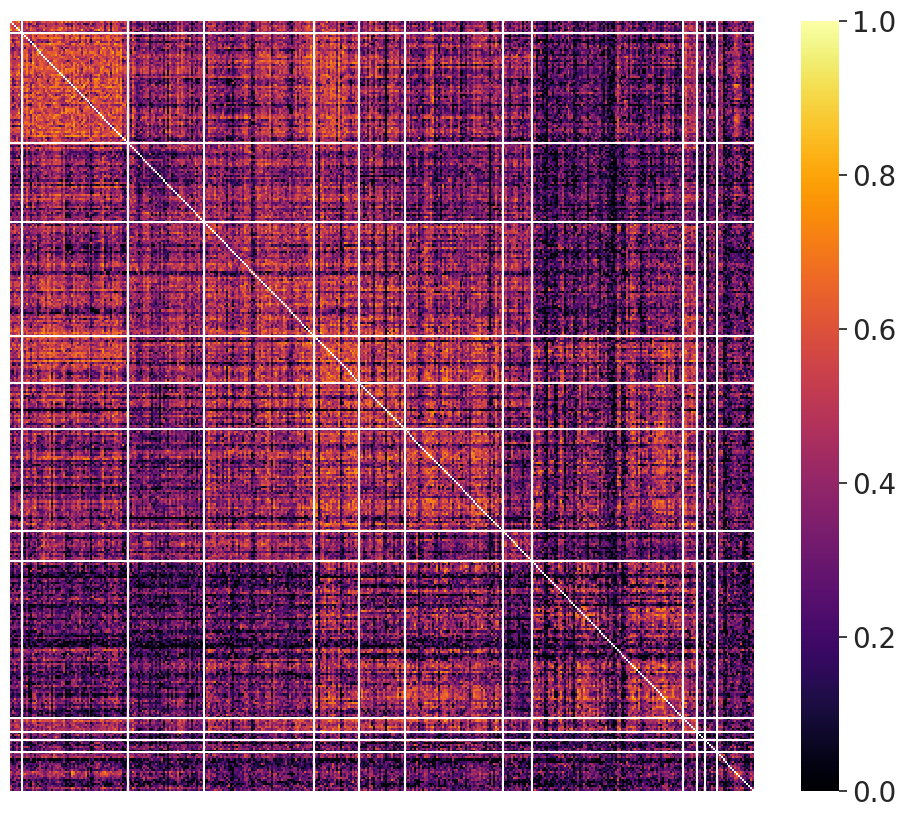

In [35]:
for key in ['rest', 'gam_FC', 'lan_FC', 'mot_FC', 'rel_FC', 'soc_FC', 'wm_FC']:
    print(key)
    indx = glanets.sort_values(by=['Cole_net_order'])['name_Glasser'].values
    data = dct_FC_mat[key].reindex(index=indx, columns=indx)

    fig= plt.figure(figsize=(12,10))

    ax =sns.heatmap(data=data, cmap='inferno',vmin=0, vmax=1)
    plt.xticks([])
    plt.yticks([])

    vec = []
    vec_nms = []
    k=0
    for i in sorted(set(glanets['Cole_net_order'])):
        #print(i)
        display()
        k+= int(len(glanets[glanets['Cole_net_order']==i].index))
        vec+=[k]
        nms = glanets[glanets['Cole_net_order']==i]['Cole_net_name'].values[0]
        vec_nms+= [nms]

    for k in vec[:-1]:
        plt.axvline(x=k, color='white')
        plt.axhline(y=k, color='white')

    # use matplotlib.colorbar.Colorbar object
    cbar = ax.collections[0].colorbar
    # here set the labelsize by 20
    cbar.ax.tick_params(labelsize=20)

    plt.savefig(path_img_out+'ICC2_Brain_NoAdj_FCs_'+key+'_1_plot_image.png',bbox_inches='tight')

    plt.show()

In [ ]:
for key in ['rest', 'gam_FC', 'lan_FC', 'mot_FC', 'rel_FC', 'soc_FC', 'wm_FC']:
    print(key)
    indx = glanets.sort_values(by=['Cole_net_order'])['name_Glasser'].values

    data = dct_FC_mat[key].reindex(index=indx, columns=indx)


    fig= plt.figure(figsize=(10,10))

    ax1 = plt.subplot2grid((20, 20), (0, 1), colspan=19) #x, horizontal
    ax2 = plt.subplot2grid((20, 20), (1, 0), rowspan=19) #y, vertical
    ax3 = plt.subplot2grid((20, 20), (1, 1), rowspan=19, colspan=19, sharex=ax1, sharey=ax2)


    vec = []
    vec_nms = []
    k=0
    for i in sorted(set(glanets['Cole_net_order'])):
        #print(i)
        display()
        k+= int(len(glanets[glanets['Cole_net_order']==i].index))
        vec+=[k]
        nms = glanets[glanets['Cole_net_order']==i]['Cole_net_name'].values[0]
        vec_nms+= [nms]


    for k in vec[:-1]:
        ax1.axvline(x=k, color='black')
        ax2.axhline(y=k, color='black')
        ax3.axvline(x=k, color='white')
        ax3.axhline(y=k, color='white')

    clrss = ['blue', 'blueviolet', 'cyan', 'purple', 'lime', 'teal', 'yellow', 'orchid', 'red', 'sienna', 'sandybrown', 'olivedrab', 'silver']    
    #clrss = clrss[::-1]
    lblss = vec_nms

    for n in range(len(vec)):
        if n==0:
            xmin=0
            xmax=vec[n]
        else:
            xmin=vec[n-1]
            xmax=vec[n]

        ax1.axvspan(xmin=xmin, xmax = xmax, ymax=1, facecolor=clrss[n], label=lblss[n])
        ax2.axhspan(ymin=xmin, ymax = xmax, xmax=1, facecolor=clrss[n])

    ax3 = sns.heatmap(data=data, cmap='inferno',vmin=0, vmax=1,  cbar=False)#square=True,
    ax3.set_xticks([])
    ax3.set_yticks([])   

    ax1.set_ylim((0,0.5))
    ax2.set_xlim((0,0.5))
    ax1.set_xticks([])
    ax1.set_yticks([])
    ax2.set_xticks([])
    ax2.set_yticks([])

    fig.legend(bbox_to_anchor=(0.12,0.885), fontsize=24)
    #ax2.legend(sns.color_palette('inferno', as_cmap=True))
    #fig.colorbar(sns.color_palette('inferno', as_cmap=True))
    #fig.colorbar(cm.ScalarMappable(cmap='inferno'), ax=axs[10:12])

    plt.savefig(path_img_out+'ICC_Brain_NoAdj_FCs_'+key+'_2_plot_image.svg',bbox_inches='tight')

    plt.show()

rest


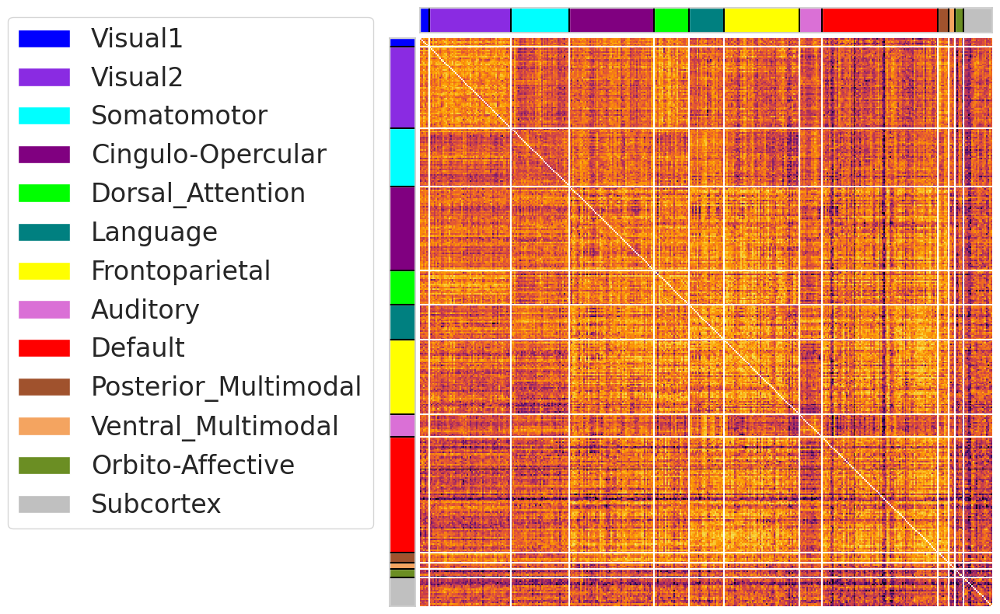

gam_FC


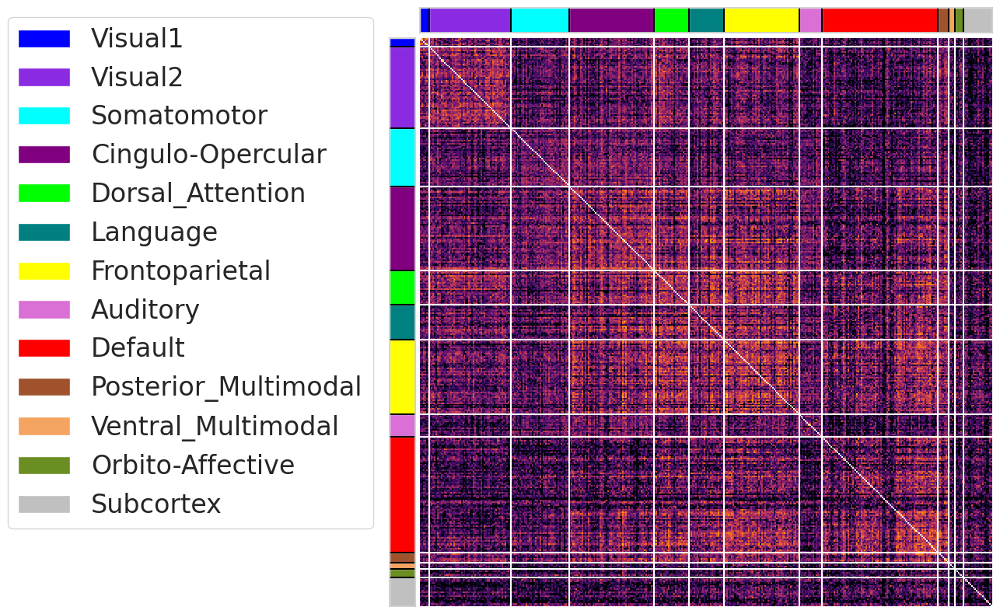

lan_FC


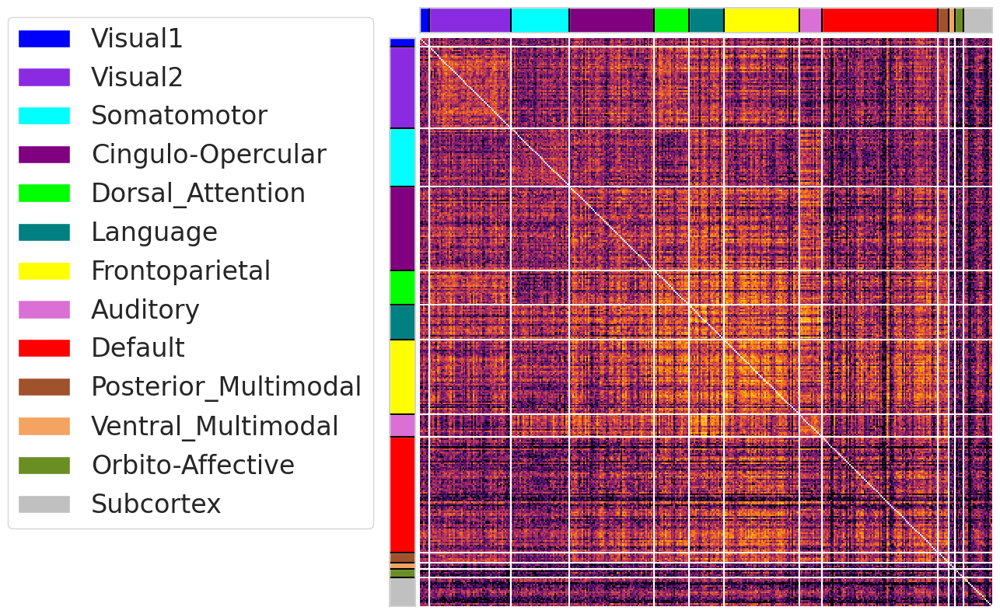

mot_FC


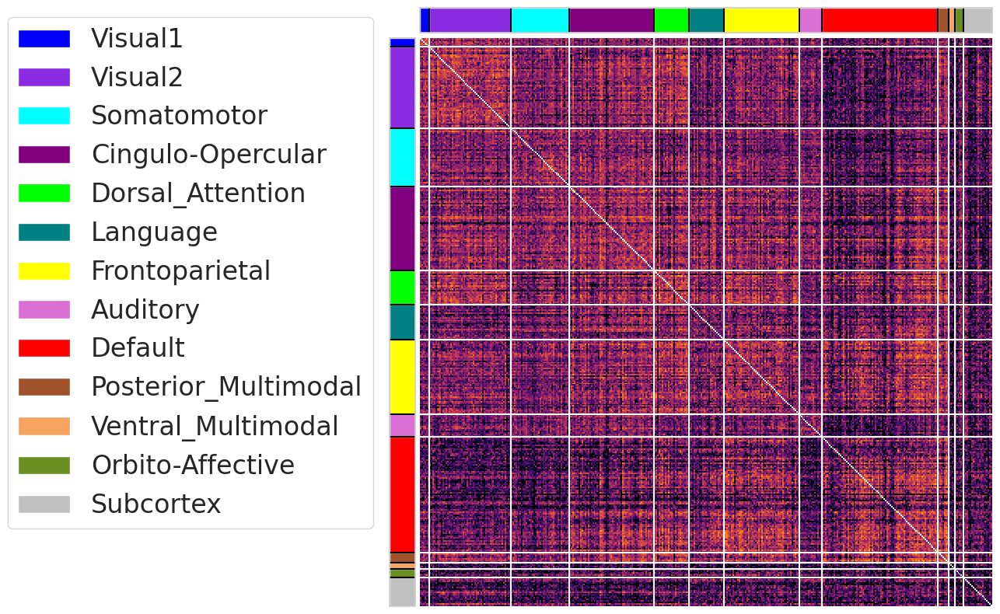

rel_FC


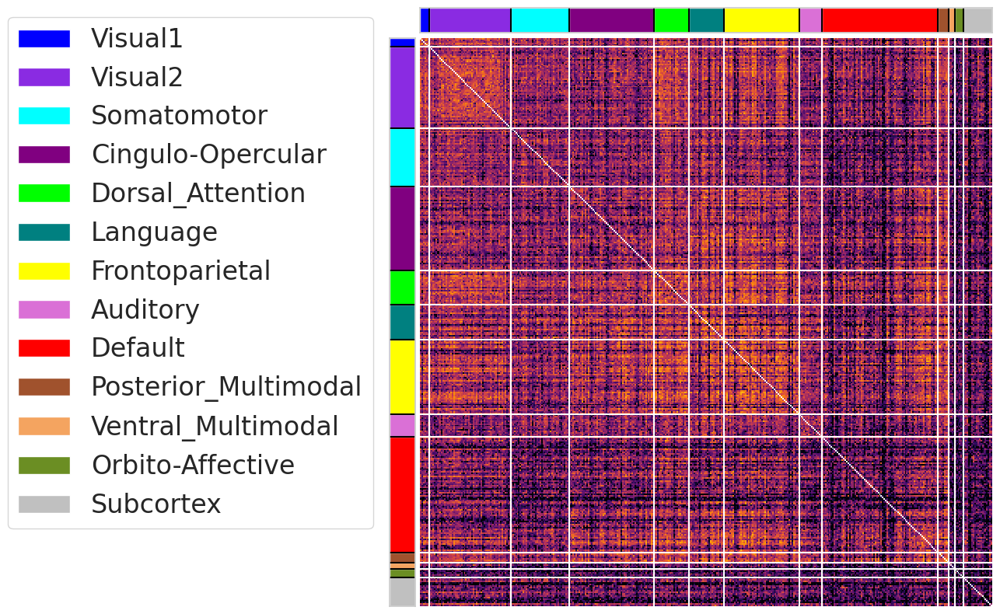

soc_FC


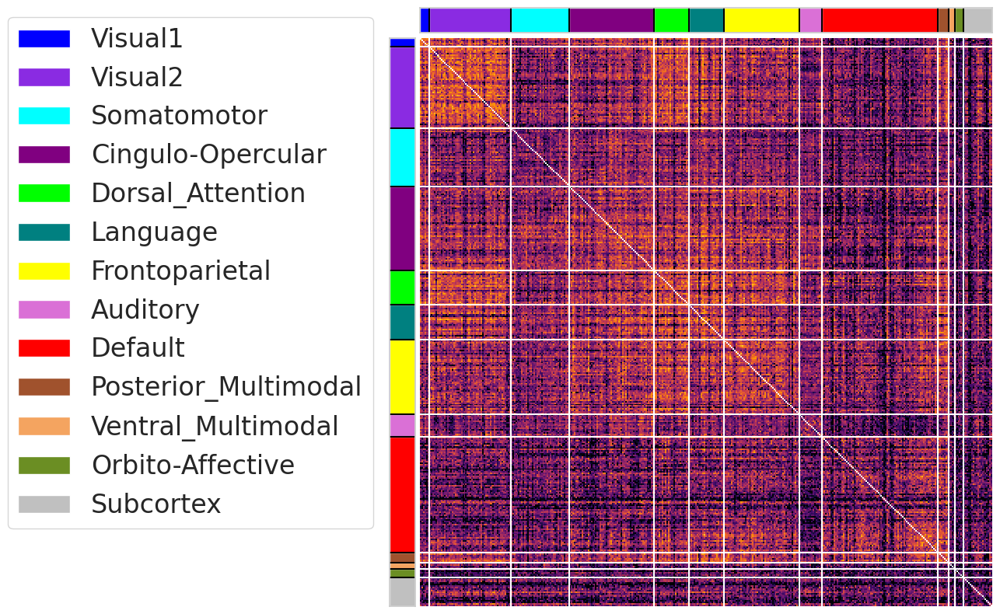

wm_FC


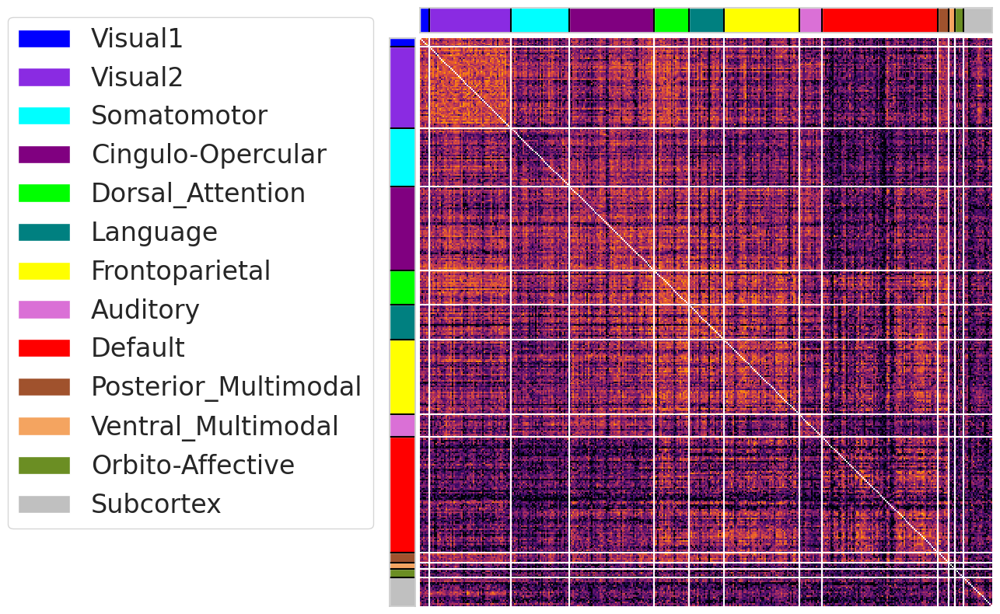

In [37]:
for key in ['rest', 'gam_FC', 'lan_FC', 'mot_FC', 'rel_FC', 'soc_FC', 'wm_FC']:
    print(key)
    indx = glanets.sort_values(by=['Cole_net_order'])['name_Glasser'].values

    data = dct_FC_mat[key].reindex(index=indx, columns=indx)


    fig= plt.figure(figsize=(10,10))

    ax1 = plt.subplot2grid((20, 20), (0, 1), colspan=19) #x, horizontal
    ax2 = plt.subplot2grid((20, 20), (1, 0), rowspan=19) #y, vertical
    ax3 = plt.subplot2grid((20, 20), (1, 1), rowspan=19, colspan=19, sharex=ax1, sharey=ax2)


    vec = []
    vec_nms = []
    k=0
    for i in sorted(set(glanets['Cole_net_order'])):
        #print(i)
        display()
        k+= int(len(glanets[glanets['Cole_net_order']==i].index))
        vec+=[k]
        nms = glanets[glanets['Cole_net_order']==i]['Cole_net_name'].values[0]
        vec_nms+= [nms]


    for k in vec[:-1]:
        ax1.axvline(x=k, color='black')
        ax2.axhline(y=k, color='black')
        ax3.axvline(x=k, color='white')
        ax3.axhline(y=k, color='white')

    clrss = ['blue', 'blueviolet', 'cyan', 'purple', 'lime', 'teal', 'yellow', 'orchid', 'red', 'sienna', 'sandybrown', 'olivedrab', 'silver']    
    #clrss = clrss[::-1]
    lblss = vec_nms

    for n in range(len(vec)):
        if n==0:
            xmin=0
            xmax=vec[n]
        else:
            xmin=vec[n-1]
            xmax=vec[n]

        ax1.axvspan(xmin=xmin, xmax = xmax, ymax=1, facecolor=clrss[n], label=lblss[n])
        ax2.axhspan(ymin=xmin, ymax = xmax, xmax=1, facecolor=clrss[n])

    ax3 = sns.heatmap(data=data, cmap='inferno',vmin=0, vmax=1,  cbar=False)#square=True,
    ax3.set_xticks([])
    ax3.set_yticks([])   

    ax1.set_ylim((0,0.5))
    ax2.set_xlim((0,0.5))
    ax1.set_xticks([])
    ax1.set_yticks([])
    ax2.set_xticks([])
    ax2.set_yticks([])

    fig.legend(bbox_to_anchor=(0.12,0.885), fontsize=24)
    #ax2.legend(sns.color_palette('inferno', as_cmap=True))
    #fig.colorbar(sns.color_palette('inferno', as_cmap=True))
    #fig.colorbar(cm.ScalarMappable(cmap='inferno'), ax=axs[10:12])

    plt.savefig(path_img_out+'ICC2_Brain_NoAdj_FCs_'+key+'_2_plot_image.png',bbox_inches='tight')

    plt.show()

In [38]:
#Mean ICC values for Cole nets for each FC modality

for key in ['rest', 'gam_FC', 'lan_FC', 'mot_FC', 'rel_FC', 'soc_FC', 'wm_FC']:
    print(key)
    indx = glanets.sort_values(by=['Cole_net_order'])['name_Glasser'].values

    data = dct_FC_mat[key].reindex(index=indx, columns=indx)
    
    net_icc = {}
    for i in sorted(set(glanets['Cole_net_name'])):
        indxs = glanets[glanets['Cole_net_name']==i]['name_Glasser'].values
        df= data.reindex(index=indxs, columns=indxs)
        df = df.where(np.triu(np.ones(df.shape)).astype(np.bool))
        df = df.stack().reset_index()
        df.columns = ['Row','Column','Value']
        net_icc[i] = df['Value'].mean()
    net_icc = pd.Series(net_icc)
    #print(key)
    display(net_icc.sort_values(ascending=False))

rest


Language                0.759105
Posterior_Multimodal    0.755328
Dorsal_Attention        0.749429
Visual2                 0.737637
Visual1                 0.736538
Frontoparietal          0.720879
Ventral_Multimodal      0.687425
Cingulo-Opercular       0.678774
Default                 0.677802
Auditory                0.647214
Somatomotor             0.604419
Subcortex               0.516590
Orbito-Affective        0.450684
dtype: float64

gam_FC


Visual1                 0.498678
Dorsal_Attention        0.439327
Frontoparietal          0.413177
Visual2                 0.376745
Posterior_Multimodal    0.369803
Cingulo-Opercular       0.367987
Language                0.353077
Somatomotor             0.302255
Default                 0.301611
Auditory                0.296707
Subcortex               0.124381
Orbito-Affective        0.078237
Ventral_Multimodal      0.074054
dtype: float64

lan_FC


Language                0.596817
Frontoparietal          0.586437
Auditory                0.576699
Dorsal_Attention        0.564181
Posterior_Multimodal    0.514938
Visual2                 0.502108
Cingulo-Opercular       0.445689
Visual1                 0.432422
Somatomotor             0.431433
Default                 0.371090
Ventral_Multimodal      0.312285
Subcortex               0.257971
Orbito-Affective        0.192062
dtype: float64

mot_FC


Posterior_Multimodal    0.525650
Visual1                 0.516672
Dorsal_Attention        0.468856
Visual2                 0.444328
Cingulo-Opercular       0.414915
Frontoparietal          0.395482
Somatomotor             0.383780
Auditory                0.356230
Default                 0.347414
Language                0.309031
Orbito-Affective        0.211381
Subcortex               0.186140
Ventral_Multimodal      0.034606
dtype: float64

rel_FC


Posterior_Multimodal    0.589128
Visual1                 0.554946
Dorsal_Attention        0.508889
Visual2                 0.486643
Language                0.482199
Frontoparietal          0.476239
Auditory                0.398018
Somatomotor             0.378676
Cingulo-Opercular       0.367469
Default                 0.279195
Subcortex               0.165280
Ventral_Multimodal      0.146342
Orbito-Affective        0.126452
dtype: float64

soc_FC


Visual1                 0.647164
Posterior_Multimodal    0.594900
Visual2                 0.546388
Dorsal_Attention        0.529360
Language                0.505561
Frontoparietal          0.461867
Cingulo-Opercular       0.446385
Auditory                0.380888
Default                 0.334731
Somatomotor             0.323928
Subcortex               0.207324
Orbito-Affective        0.142168
Ventral_Multimodal      0.120293
dtype: float64

wm_FC


Visual1                 0.562729
Visual2                 0.545583
Posterior_Multimodal    0.541095
Dorsal_Attention        0.526319
Language                0.464502
Frontoparietal          0.435553
Cingulo-Opercular       0.428495
Auditory                0.404810
Somatomotor             0.321634
Default                 0.313829
Subcortex               0.266368
Orbito-Affective        0.105760
Ventral_Multimodal      0.040006
dtype: float64